<div align="center">
  <h1>Shivam Kumar (22ce01046)</h1>
    <h3>Assignment-1</h3>
</div>                        

In [1]:
# Import the necessary packages.
# import Pkg;
# Pkg.add(["Plots", "LaTeXStrings", "CalculusWithJulia","PyPlot"])

1.) Consider that the height of a hill is described by the given scalar field as
 $h(x,y) = 200−x^2 −2y^2$
 
 (a) Plot the given scalar field as both a three-dimensional (3D) surface plot and a two-dimensional (2D) contour plot using Julia. (you may use the package **Plots.jl** for plotting).
 
 (b) Plot the gradient of the scalar field using the automatic gradient calculation tool available in Julia (you may use the package called **CalculusWithJulia.jl**).
 
 (c) Determine the gradient vector and plot the obtained gradient vector field (you may        use the package called **Plots.jl** or **CalculusWithJulia.jl**).

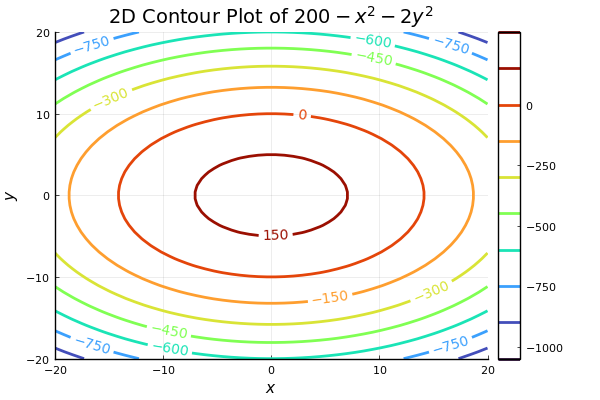

In [16]:
using Plots; pythonplot()
 using LaTeXStrings
using CalculusWithJulia

 # Write the function.
 f(x, y) = 200 - x^2 - 2y^2

 # Define range of x and y.
 x_range = range(-20, 20, length=50)
 y_range = range(-20, 20, length=50)

 # Store the z value at every possible combination of x and y in the array.
 z = [f(x,y) for y in y_range, x in x_range]

 # Now we have a value of x, y and z

 #generating 2D contour graph
 contour(x_range, y_range, z, levels=10,color=:turbo, clabels=true, cbar=true,
lw=2)
 title!(L"2D Contour Plot of $200 - x^2 - 2y^2$")
 xlabel!(L"x")
 ylabel!(L"y")

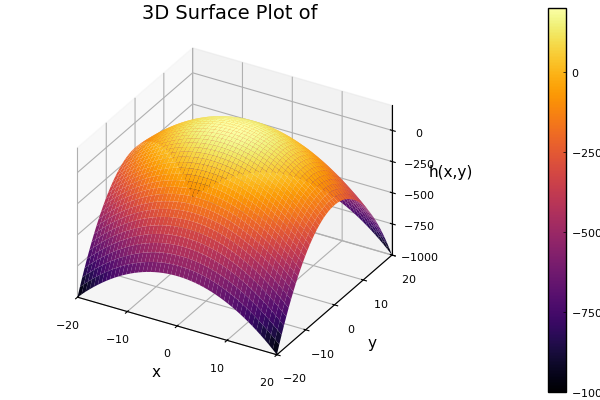

In [17]:
# 3D Surface Plot
surface(x_range, y_range, z, title="3D Surface Plot of", xlabel="x",
ylabel="y", zlabel="h(x,y)")

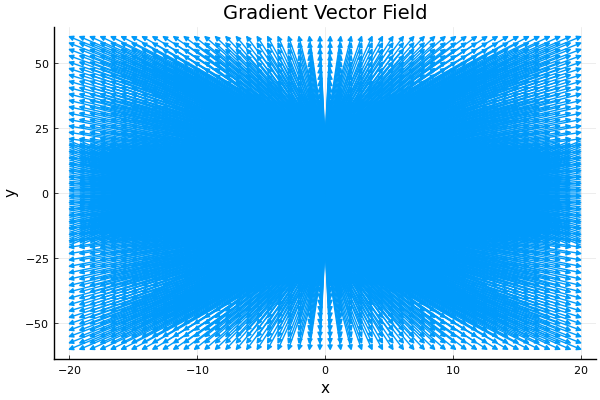

In [18]:
# Define the function as a single-argument vector function
f(v) = 200 - v[1]^2 - 2*v[2]^2
# Get the gradient function using CalculusWithJulia
 grad_h = gradient(f)

 # Store the possible x and y coordinates.
 x_coords = [x for x in x_range for y in y_range]
 y_coords = [y for x in x_range for y in y_range]

 # Calculate the gradient vectors at each point (x, y)
 vectors = [grad_h([x, y]) for x in x_range for y in y_range]

 # Split the vector into the component.
 u = getindex.(vectors,1)
 v = getindex.(vectors,2)

 # quiver plot (a vector field plot)
 # Plot the vector field
 quiver(x_coords, y_coords, quiver=(u, v),arrowsize=0.1,
 title="Gradient Vector Field", xlabel="x", ylabel="y")

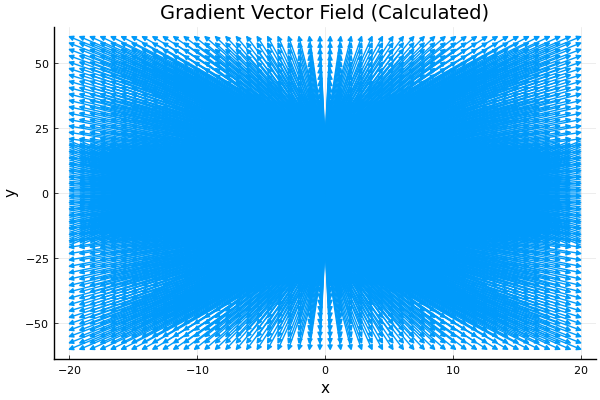

In [19]:
# Define the components of the gradient vector field
 fx(x, y) = -2x
 fy(x, y) = -4y
 u_coords = [fx(x,y) for x in x_range for y in y_range]
 v_coords = [fy(x,y) for x in x_range for y in y_range]

 # Plot the quiver plot using the calculated components
 quiver(x_coords, y_coords, quiver=(u_coords, v_coords),arrowsize=0.01,
 title="Gradient Vector Field (Calculated)", xlabel="x", ylabel="y")

2.) Consider a cyclone in the northern hemisphere described by the velocity vector field of the wind: $v(x,y) = x{e_1} −y^2{e_2}$ where x and y are the coordinates in the horizontal plane, and ${e_1}$ and ${e_2}$ are unit vectors in the x- and y-directions, respectively.

(a) Plot the given vector field in Julia. (you may use the package called **Plots.jl** or **CalculusWithJulia.jl**).

(b) Plot the divergence of the vector field using automatic divergence calculation available in the Julia package called **CalculusWithJulia.jl**. Also, determine the divergence using the detailed calculation and plot the same. Compare both plots and verify the results.

(c) Determine the curl of the vector field using automatic curl calculation available in the Julia package **CalculusWithJulia.jl**. Also, determine the curl using detailed calculation and plot the same. Compare both plots and verify the results.

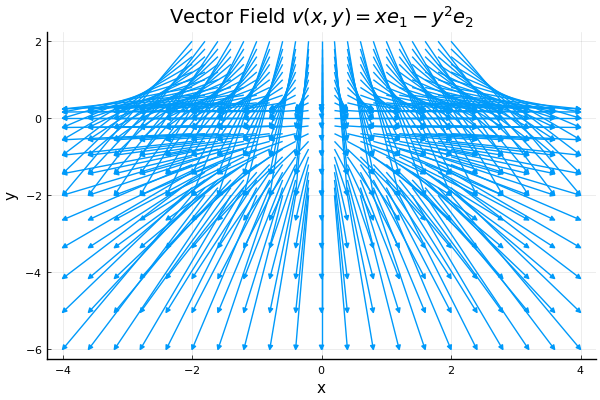

In [6]:
using Plots

 # Define the vector field function
 v1(x, y) = (x, -y^2)

 # Define the x and y range.
 x_range = -2.0:0.2:2.0
 y_range = -2.0:0.2:2.0

 # Define the cordinate of x and y.
 x_coords = [x for x in x_range for y in y_range]
 y_coords = [y for x in x_range for y in y_range]

 # Calculate the components of the vectors at each point
 u_coords = [v1(x, y)[1] for x in x_range for y in y_range]
 v_coords = [v1(x, y)[2] for x in x_range for y in y_range]

 # Create the quiver plot
 quiver(x_coords, y_coords, quiver=(u_coords, v_coords), arrowsize=0.1,
legend=false, title=L"Vector Field $v(x,y) = xe_1 -y^2e_2$", xlabel="x",
ylabel="y")

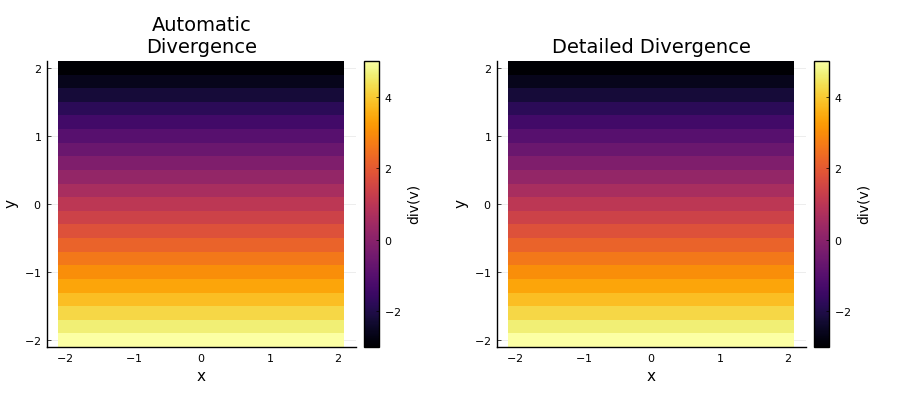

In [7]:
using CalculusWithJulia

 # Define the vector field as a function
 v1(x, y) = [x, -y^2]
 v_vec(xy) = v1(xy[1], xy[2])

 # --- Automatic Divergence Calculation ---
 # The divergence function `divergence(f)` will return a new function representing the divergence
 div_auto = divergence(v_vec)

 # Calculate the values of the divergence on the grid
 Z_auto = [div_auto([x, y]) for y in y_range, x in x_range]

 # Plot the automatic divergence
 p1 = heatmap(x_range, y_range, Z_auto, aspect_ratio=:equal, title="Automatic
Divergence", xlabel="x", ylabel="y", colorbar_title="div(v)")

 # --- Detailed (Manual) Divergence Calculation ---
 # Define the function for the manual calculation
 div_manual(x, y) = 1 - 2y

 # Calculate the values of the manual divergence on the grid
 Z_manual = [div_manual(x, y) for y in y_range, x in x_range]

# Plot the manual divergence
 p2 = heatmap(x_range, y_range, Z_manual, aspect_ratio=:equal, title="Detailed Divergence", xlabel="x", ylabel="y", colorbar_title="div(v)")

 # Combine plots for comparison
 plot(p1, p2, layout=(1, 2), size=(900, 400))

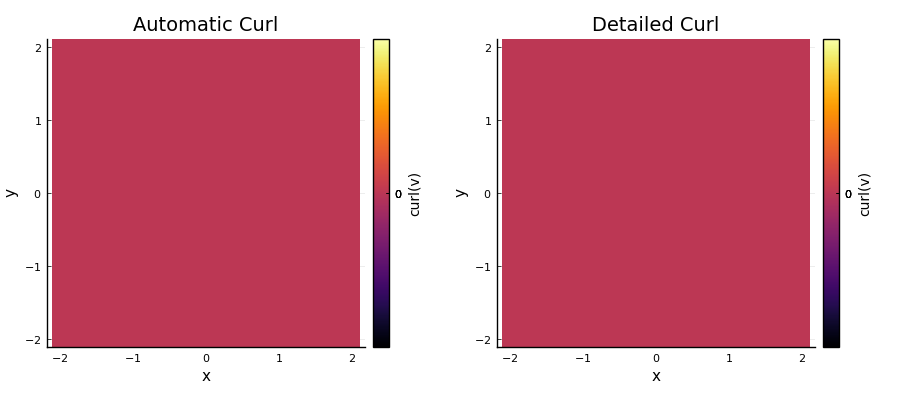

In [8]:
# --- Automatic Curl Calculation ---
 # The curl function `curl(f)` returns a new function that returns a scalar
 curl_auto = curl(v_vec)

 # Calculate the values of the automatic curl on the grid.
 Z_auto_curl = [curl_auto([x, y]) for y in y_range, x in x_range]

 # Plot the automatic curl
 p3 = heatmap(x_range, y_range, Z_auto_curl, aspect_ratio=:equal,
title="Automatic Curl", xlabel="x", ylabel="y", colorbar_title="curl(v)")

 # --- Detailed (Manual) Curl Calculation ---
 # Define the function for the manual calculation
 # The curl is dQ/dx - dP/dy = 0 - 0 = 0.
 curl_manual(x, y) = 0.0

 # Calculate the values of the manual curl on the grid
 Z_manual_curl = [curl_manual(x, y) for y in y_range, x in x_range]

 # Plot the manual curl
 p4 = heatmap(x_range, y_range, Z_manual_curl, aspect_ratio=:equal,
title="Detailed Curl", xlabel="x", ylabel="y", colorbar_title="curl(v)")

# Combine plots for comparison
 plot(p3, p4, layout=(1, 2), size=(900, 400))

3.) Consider that the velocity of water particles in a river is described by the vector field  $f =e^xy^2e_1 +(x+2y)e_2$ . 

 (a) Plot the given vector field in Julia. (you may use the package called **Plots.jl** or **CalculusWithJulia.jl**).

 (b) Plot the divergence of the vector field using automatic divergence calculation available in the Julia
 package called **CalculusWithJulia.jl**. Also, determine the divergence using the detailed calculation
 and plot the same. Compare both plots and verify the results.

 (c) Determine the curl of the vector field using automatic curl calculation available in the Julia package
 **CalculusWithJulia.jl**. Also, determine the curl using detailed calculation and plot the same. Compare
 both plots and verify the results.

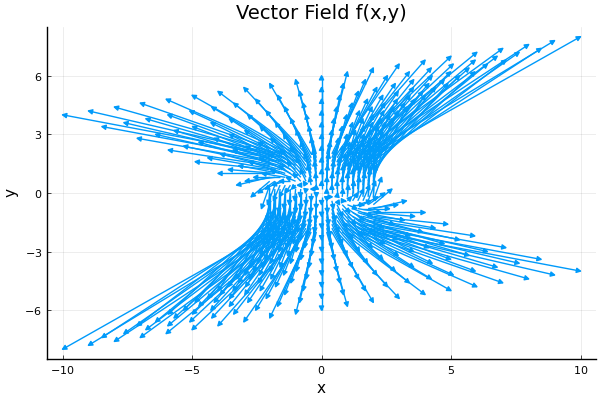

In [9]:
using Plots

 # Define the vector field function
 f(x, y) = (x * y^2, x + 2y)

 # Define the grid for the plot
 x_range = -2.0:0.2:2.0
 y_range = -2.0:0.2:2.0

 # Define the cordinate of x and y.
 x_coords = [x for x in x_range for y in y_range]
 y_coords = [y for x in x_range for y in y_range]

# Calculate the components of the vectors at each point
 u_coords = [f(x, y)[1] for x in x_range for y in y_range]
 v_coords = [f(x, y)[2] for x in x_range for y in y_range]

 # Create the quiver plot
 plot_vf = quiver(x_coords, y_coords, quiver=(u_coords, v_coords),
 arrowsize=0.3,
 legend=false,
 title="Vector Field f(x,y)",
 xlabel="x",
 ylabel="y")

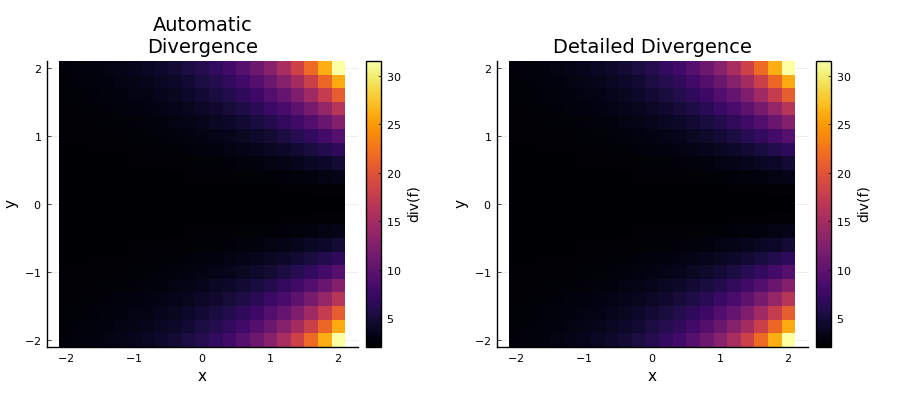

In [10]:
using CalculusWithJulia

 # Corrected function definition to take a single vector `p`
 v1(x,y) = [e^x*y^2, x+2*y]
 f(p) = v1(p[1], p[2])

 # --- Automatic Divergence Calculation ---
 # The divergence function now works correctly on `f`
 div_auto = divergence(f)

# Calculate the values of the automatic divergence on the grid.
 # Note: We now pass a single vector `[x, y]` to `div_auto`.
 Z_auto_div = [div_auto([x, y]) for y in y_range, x in x_range]

 # Plot the automatic divergence
 p1 = heatmap(x_range, y_range, Z_auto_div, aspect_ratio=:equal, title="Automatic
Divergence", xlabel="x", ylabel="y", colorbar_title="div(f)")

 # --- Detailed (Manual) Divergence Calculation ---
 # This part does not need correction as it is not using the automatic method
 div_manual(x, y) = y^2*e^x + 2
 Z_manual_div = [div_manual(x, y) for y in y_range, x in x_range]

 # Plot the manual divergence
 p2 = heatmap(x_range, y_range, Z_manual_div, aspect_ratio=:equal,
title="Detailed Divergence", xlabel="x", ylabel="y",
colorbar_title="div(f)")



 # Combine and display plots for comparison
 plot(p1, p2, layout=(1, 2), size=(900, 400))

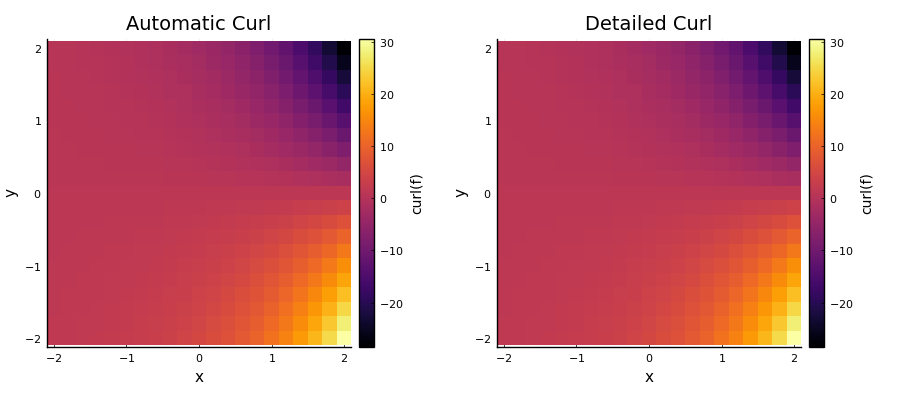

In [11]:
# Use the same corrected function definition from part (b)
 f(p) = [e^p[1] * p[2]^2, p[1] + 2 * p[2]]

 # --- Automatic Curl Calculation ---
 # The curl function now works correctly on `f`
 curl_auto = curl(f)

# Calculate the values of the automatic curl on the grid.
 Z_auto_curl = [curl_auto([x, y]) for y in y_range, x in x_range]

 # Plot the automatic curl
 p3 = heatmap(x_range, y_range, Z_auto_curl, aspect_ratio=:equal,
title="Automatic Curl", xlabel="x", ylabel="y", colorbar_title="curl(f)")

 # --- Detailed (Manual) Curl Calculation ---
 # This part does not need correction
 curl_manual(x, y) = 1 - 2*e^x * y
 Z_manual_curl = [curl_manual(x, y) for y in y_range, x in x_range]

 # Plot the manual curl
 p4 = heatmap(x_range, y_range, Z_manual_curl, aspect_ratio=:equal,
title="Detailed Curl", xlabel="x", ylabel="y", colorbar_title="curl(f)")

 # Combine and display plots for comparison
 plot(p3, p4, layout=(1, 2), size=(900, 400))

 4.) Write a Julia code for the solution of the beam problem shown in Fig. 1. Plot the bending moment diagram (BMD) and shear force diagram (SFD). Your code should be generic enough to take any value for the input variables l and q.
 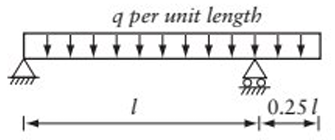

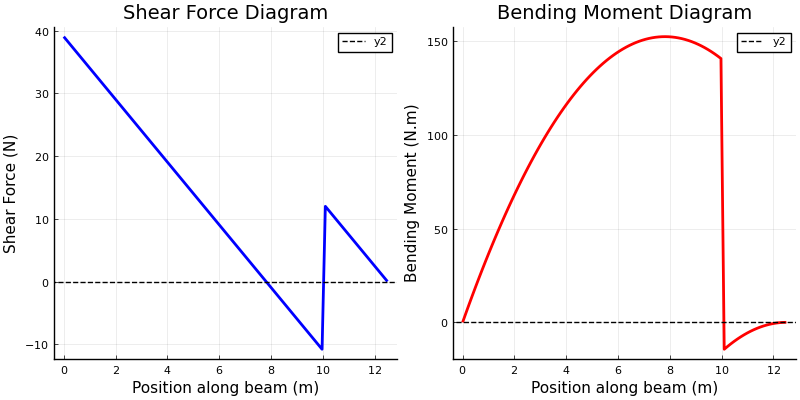

In [12]:
using Plots

 # --- Input variables ---
 # Define the total length of the beam (l) and the uniform load (q).
 l = 10.0 # Length of the main span in meters
 q = 5.0 # Uniform distributed load in N/m

 # --- Calculations ---
 R_B = (1.25-(1.25^2)/2) * q * l
 R_A = 1.25 * q * l - R_B

 # 2. Define the functions for shear force (V) and bending moment (M) along the beam.
 # x is the position along the beam, from 0 to 1.25l.
 function shear_force(x, q, R_A, R_B)
 if x <= l # Section from left support to right support (0 <= x <= l)
 return R_A - q * x
 else
 # Section on the overhang (l < x <= 1.25l)
 return R_A + R_B - q * x
 end
 end

 function bending_moment(x, q, R_A, R_B)
 if x <= l # Section from left support to right support (0 <= x <= l)
 return R_A * x - (q * x * x) / 2
 else
 # Section on the overhang (l < x <= 1.25l)
 # Let x' be the distance from the right end (x' = 1.25l - x).
 # M = -q * x'^2 / 2
 x_prime = (1.25 * l) - x
 return - (q * x_prime * x_prime) / 2
 end
 end

 # --- Plotting ---
 # Create an array of x-values for the plot.
 x_values = range(0, stop=1.25*l, length=100)
# Calculate the corresponding shear force and bending moment values.
 V_values = [shear_force(x, q, R_A, R_B) for x in x_values]
 M_values = [bending_moment(x, q, R_A, R_B) for x in x_values]

 # Plot the Shear Force Diagram (SFD).
 sfd_plot = plot(x_values, V_values, title="Shear Force Diagram",
xlabel="Position along beam (m)", ylabel="Shear Force (N)", label="", lw=2,
linecolor=:blue, grid=true, size=(800, 400))

 hline!([0], lw=1, linecolor=:black, linestyle=:dash)

 # Plot the Bending Moment Diagram (BMD).
 bmd_plot = plot(x_values, M_values, title="Bending Moment Diagram",
xlabel="Position along beam (m)", ylabel="Bending Moment (N.m)", label="",
lw=2, linecolor=:red, grid=true, size=(800, 400))


 hline!([0], lw=1, linecolor=:black, linestyle=:dash)

 # Display the plots.
 plot(sfd_plot, bmd_plot)

 ### 5. Write a Julia code for the solution of the beam problem shown in Fig. 2. Plot the BMD and SFD. Your code should be generic enough to take any value for the input variables l and q.
 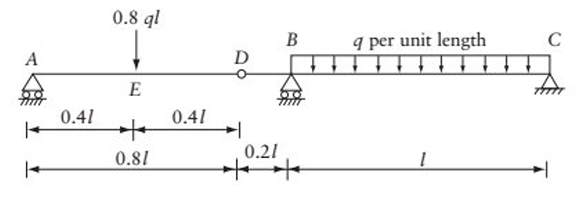

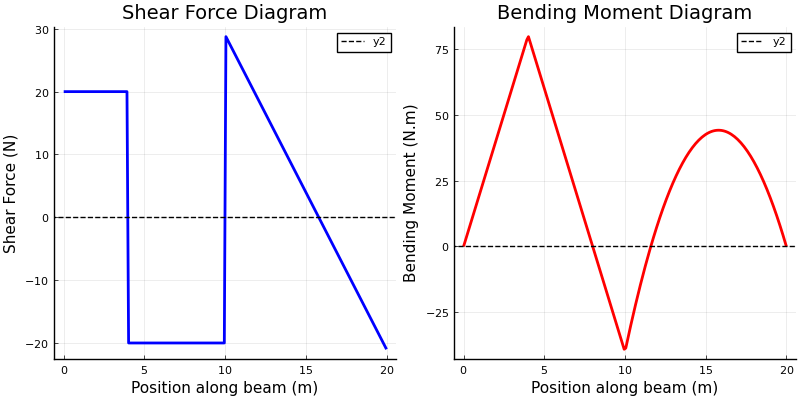

In [13]:
using Plots

 # --- Input variables ---
 # Define the total length of the main span (l) and the uniform load (q).
 l = 10.0 # Length parameter in meters.
 q = 5.0 # Uniform distributed load in N/m

 # --- Calculations ---
 R_A = 0.4 * q * l
 R_B = 0.98 * q * l
 R_C = 1.8 * q * l - R_A - R_B

 # --- Define Shear Force and Bending Moment Functions ---
 # These functions calculate the internal forces at any point 'x' along the beam.
 # The beam is divided into four sections based on the loads and supports.
 function shear_force(x, l, q, R_A, R_B)
 if x <= 0.4l # Section AE (0 <= x <= 0.4l)
 return R_A
 elseif x <= 0.8l # Section ED (0.4l < x <= 0.8l)
 return R_A - (0.8 * q * l)
 elseif x <= l # Section DB (0.8l < x <= l)
 return R_A - (0.8 * q * l)
 else
 # Section BC (l < x <= 2l)
 return R_A - (0.8 * q * l) + R_B - q * (x - l)
 end
 end
 function bending_moment(x, l, q, R_A, R_B)
 if x <= 0.4l # Section AE (0 <= x <= 0.4l)
 return R_A * x
 elseif x <= 0.8l # Section ED (0.4l < x <= 0.8l)
 return R_A * x - (0.8 * q * l) * (x - 0.4l)
 elseif x <= l # Section DB (0.8l < x <= l)
 return R_A * x - (0.8 * q * l) * (x - 0.4l)
 else
 # Section BC (l < x <= 2l)
 return R_A * x - (0.8 * q * l) * (x - 0.4l) + R_B * (x - l) - (q * (x -
l)^2) / 2
 end
 end

# --- Plotting ---
 # Define range of x
 x_values = range(0, stop=2l, length=200)

 # Calculate the corresponding shear force and bending moment values.
 V_values = [shear_force(x, l, q, R_A, R_B) for x in x_values]
 M_values = [bending_moment(x, l, q, R_A, R_B) for x in x_values] # Plot the Shear Force Diagram (SFD).
 sfd_plot = plot(x_values, V_values, title="Shear Force Diagram",
xlabel="Position along beam (m)", ylabel="Shear Force (N)", label="", lw=2,
linecolor=:blue, grid=true, size=(800, 400))


 hline!([0], lw=1, linecolor=:black, linestyle=:dash);

 # Plot the Bending Moment Diagram (BMD).
 bmd_plot = plot(x_values, M_values, title="Bending Moment Diagram",
xlabel="Position along beam (m)", ylabel="Bending Moment (N.m)", label="",
lw=2, linecolor=:red, grid=true, size=(800, 400))


 hline!([0], lw=1, linecolor=:black, linestyle=:dash);

 # Display the plots.
 plot(sfd_plot, bmd_plot)